In [47]:
import torch

random = []

for r in [0.5, 2.5]:
    random.append(torch.load(f'../../cache/llama/bef_ensb/ensbn20_agreement_{r}.pth', map_location=torch.device('cpu')))


In [48]:
random[0]

{'initial_indices': tensor([[0.0000e+00, 2.0000e+00, 4.0000e+00,  ..., 3.2000e+04, 3.2000e+04,
          3.2000e+04],
         [0.0000e+00, 2.0000e+00, 4.0000e+00,  ..., 3.2000e+04, 3.2000e+04,
          3.2000e+04],
         [0.0000e+00, 2.0000e+00, 4.0000e+00,  ..., 3.2000e+04, 3.2000e+04,
          3.2000e+04],
         ...,
         [0.0000e+00, 2.0000e+00, 4.0000e+00,  ..., 3.2000e+04, 3.2000e+04,
          3.2000e+04],
         [0.0000e+00, 2.0000e+00, 4.0000e+00,  ..., 3.2000e+04, 3.2000e+04,
          3.2000e+04],
         [0.0000e+00, 2.0000e+00, 4.0000e+00,  ..., 3.2000e+04, 3.2000e+04,
          3.2000e+04]]),
 'initial_cnt': tensor([[      20,       20,       20,  ..., -9999999, -9999999, -9999999],
         [      20,       20,       20,  ..., -9999999, -9999999, -9999999],
         [      20,       20,       20,  ..., -9999999, -9999999, -9999999],
         ...,
         [      20,       20,       20,  ..., -9999999, -9999999, -9999999],
         [      20,       20,     

In [49]:
(random[0]['initial_cnt']==1).sum()

tensor(10656)

In [50]:
random[0]['initial_indices'].shape, random[0]['initial_cnt'].shape, 

(torch.Size([4096, 5120]), torch.Size([4096, 5120]))

In [51]:
N_H = 32
TDST_BQ = random[0]['initial_indices'].shape[0]//N_H
MASK_K = random[0]['initial_cnt'].shape[1]

initial_indices = random[0]['initial_indices'].view(N_H, TDST_BQ, -1)
initial_cnt = random[0]['initial_cnt'].view(N_H, TDST_BQ, -1)

In [52]:
filtered_mask = initial_indices != 32000

# print(filtered_mask.shape, filtered_mask, filtered_mask.sum(-2).shape, )
# print(filtered_mask.sum(-2))

is_zero = filtered_mask.sum(-2) == 0

# Determine which columns have all zeros
columns_with_all_zeros = torch.all(is_zero, dim=0)

# Find the first index where all values in a column are zero
first_column_with_all_zeros = torch.nonzero(columns_with_all_zeros, as_tuple=True)

# If there is at least one column with all zeros, get the first one
if len(first_column_with_all_zeros[0]) > 0:
    first_index = first_column_with_all_zeros[0][0].item()  # Get the index of the first such column
else:
    first_index = -1

print(first_index)

2096


In [53]:


# List to hold dictionaries
per_query_token_cnt_diclist = []

# Iterate over N_H and TDST_BQ
for i in range(N_H):
    for j in range(TDST_BQ):
        # Create a dictionary for each combination of (N_H, TDST_BQ)
        temp_dict = {}
        
        # Iterate over MASK_K to fill the dictionary
        for k in range(first_index):
            key = int(initial_indices[i, j, k].item())
            if key == 32000:
                continue
            value = initial_cnt[i, j, k].item()
            temp_dict[key] = value
        
        # Append the created dictionary to the list
        per_query_token_cnt_diclist.append(temp_dict)

In [54]:
per_query_token_cnt_diclist

[{0: 20,
  2: 20,
  4: 20,
  6: 20,
  8: 20,
  10: 20,
  12: 20,
  14: 20,
  16: 20,
  18: 20,
  20: 20,
  22: 20,
  24: 20,
  26: 20,
  28: 20,
  30: 20,
  32: 20,
  34: 20,
  36: 20,
  38: 20,
  40: 20,
  42: 20,
  44: 20,
  46: 20,
  48: 20,
  50: 20,
  52: 20,
  54: 20,
  56: 20,
  58: 20,
  60: 20,
  62: 20},
 {0: 20,
  2: 20,
  4: 20,
  6: 20,
  8: 20,
  10: 20,
  12: 20,
  14: 20,
  16: 20,
  18: 20,
  20: 20,
  22: 20,
  24: 20,
  26: 20,
  28: 20,
  30: 20,
  32: 20,
  34: 20,
  36: 20,
  38: 20,
  40: 20,
  42: 20,
  44: 20,
  46: 20,
  48: 20,
  50: 20,
  52: 20,
  54: 20,
  56: 20,
  58: 20,
  60: 20,
  62: 20,
  64: 20,
  66: 20,
  68: 20,
  70: 20,
  72: 20,
  74: 20,
  76: 20,
  78: 20,
  80: 20,
  82: 20,
  84: 20,
  86: 20,
  88: 20,
  90: 20,
  92: 20,
  94: 20,
  96: 20,
  98: 20,
  100: 20,
  102: 20,
  104: 20,
  106: 20,
  108: 20,
  110: 20,
  112: 20,
  114: 20,
  116: 20,
  118: 20,
  120: 20,
  122: 20,
  124: 20,
  126: 20},
 {0: 20,
  2: 20,
  4: 20,
  6: 20

In [60]:
per_head_token_cnt_dic2list = [per_query_token_cnt_diclist[i:i+(TDST_BQ)] for i in range(0, len(per_query_token_cnt_diclist), TDST_BQ)]

print(per_head_token_cnt_dic2list)

[[{0: 20, 2: 20, 4: 20, 6: 20, 8: 20, 10: 20, 12: 20, 14: 20, 16: 20, 18: 20, 20: 20, 22: 20, 24: 20, 26: 20, 28: 20, 30: 20, 32: 20, 34: 20, 36: 20, 38: 20, 40: 20, 42: 20, 44: 20, 46: 20, 48: 20, 50: 20, 52: 20, 54: 20, 56: 20, 58: 20, 60: 20, 62: 20}, {0: 20, 2: 20, 4: 20, 6: 20, 8: 20, 10: 20, 12: 20, 14: 20, 16: 20, 18: 20, 20: 20, 22: 20, 24: 20, 26: 20, 28: 20, 30: 20, 32: 20, 34: 20, 36: 20, 38: 20, 40: 20, 42: 20, 44: 20, 46: 20, 48: 20, 50: 20, 52: 20, 54: 20, 56: 20, 58: 20, 60: 20, 62: 20, 64: 20, 66: 20, 68: 20, 70: 20, 72: 20, 74: 20, 76: 20, 78: 20, 80: 20, 82: 20, 84: 20, 86: 20, 88: 20, 90: 20, 92: 20, 94: 20, 96: 20, 98: 20, 100: 20, 102: 20, 104: 20, 106: 20, 108: 20, 110: 20, 112: 20, 114: 20, 116: 20, 118: 20, 120: 20, 122: 20, 124: 20, 126: 20}, {0: 20, 2: 20, 4: 20, 6: 20, 8: 20, 10: 20, 12: 20, 14: 20, 16: 20, 18: 20, 20: 20, 22: 20, 24: 20, 26: 20, 28: 20, 30: 20, 32: 20, 34: 20, 36: 20, 38: 20, 40: 20, 42: 20, 44: 20, 46: 20, 48: 20, 50: 20, 52: 20, 54: 20, 56

plot h :  {}
N hardcoded to : N=1
tensor([[20.,  0., 20.,  ...,  0.,  0.,  0.],
        [20.,  0., 20.,  ...,  0.,  0.,  0.],
        [20.,  0., 20.,  ...,  0.,  0.,  0.],
        [20.,  0., 20.,  ...,  0.,  0.,  0.]])


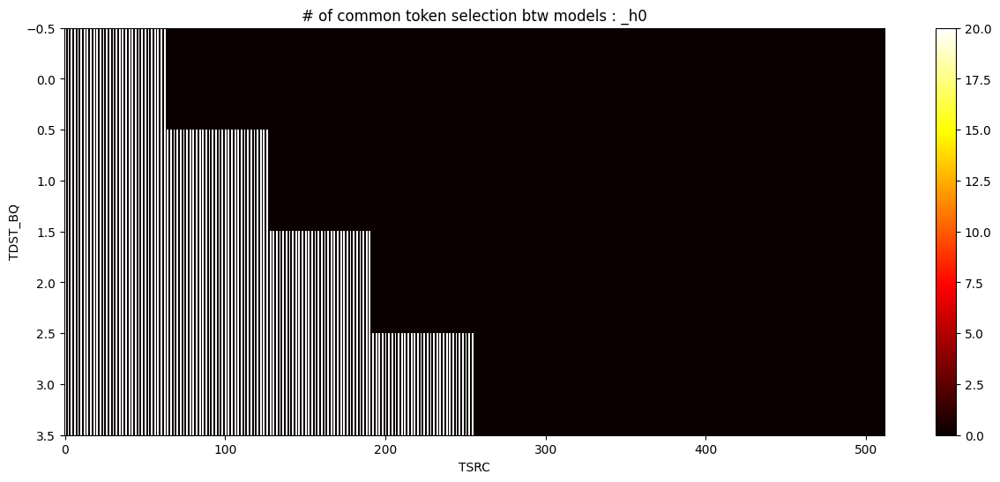

plot h :  {}
N hardcoded to : N=1
tensor([[20.,  0., 20.,  ...,  0.,  0.,  0.],
        [20.,  0., 20.,  ...,  0.,  0.,  0.],
        [20.,  0., 20.,  ...,  0.,  0.,  0.],
        [20.,  0., 20.,  ...,  0., 20.,  0.]])


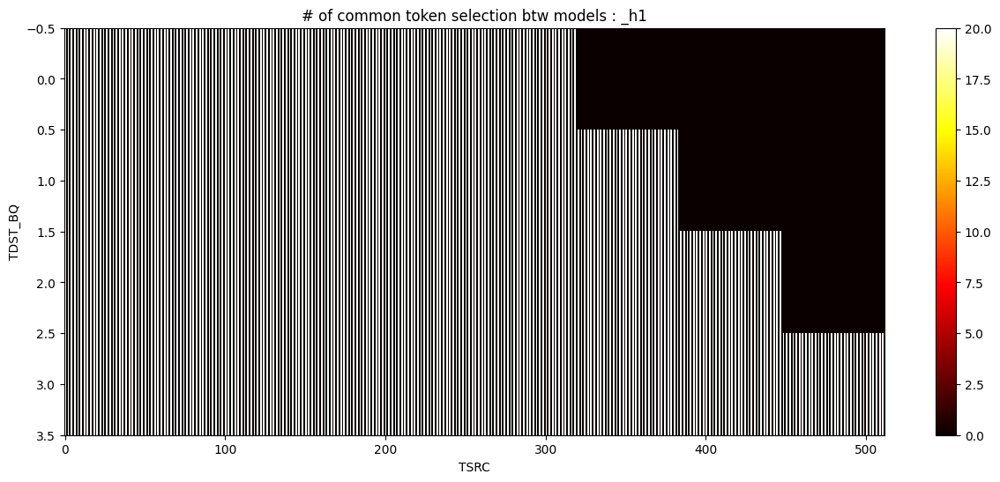

plot h :  {}
N hardcoded to : N=1
tensor([[20.,  0., 20.,  ...,  0., 20.,  0.],
        [20.,  0., 20.,  ...,  0., 20.,  0.],
        [20.,  0., 20.,  ...,  0., 20.,  0.],
        [20.,  0., 20.,  ...,  0., 20.,  0.]])


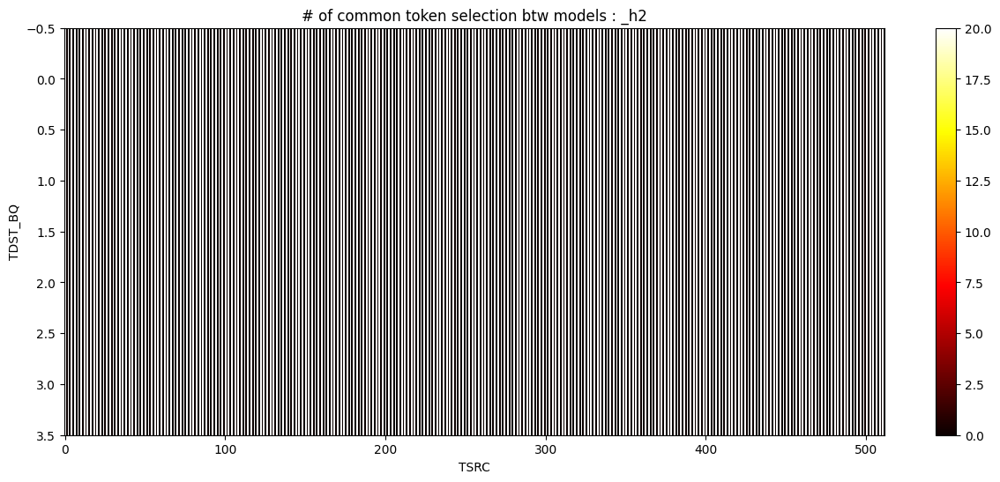

In [61]:
import torch
import matplotlib.pyplot as plt

def heatmap_q_k_cnt():
    # ks = state['ks']
    # q_hip = state['q_hip']
    # k = state['k']
    # v = state['v']
    # mask_k = state['mask_k']
    # block_size_q = state['block_size_q']
    # block_size_k = state['block_size_k']
    # ensemble = state['ensemble'],
    # ensemble_model_setting = state['ensemble_model_setting' ]
    # ensemble_method = state['ensemble_method'],
    # ensemble_method_final = state['ensemble_method_final']
    # ensemble_per_layer_n = state['ensemble_per_layer_n']
    # ensemble_per_attn_iter_n = state['ensemble_per_attn_iter_n']
    # ensemble_model_n = state['ensemble_model_n']
    # ensemble_particular_layer = state['ensemble_particular_layer']
    # layer_id = state['layer_id']

    # ensemble_attn_mask_per_layer = state['ensemble_attn_mask_per_layer']
    # per_query_token_cnt_diclist = state['per_query_token_cnt_diclist']
    # ensembled_indices = state['ensembled_indices']
    # origin_sparsity = state['origin_sparsity']
    # sparsity_per_layer = state['sparsity_per_layer']
    # sparsity_ratio = state['sparse_ratio']

    # N_H, TDST, HID = q_hip.shape
    # _, TSRC, _ = k.shape
    # assert len(per_query_token_cnt_diclist) == N_H * TDST//block_size_q

    for h in range(N_H):
        print(f"plot h : ", {})

        N = 1
        print(f"N hardcoded to : N={N}")
        q_k_map_h = torch.zeros((TDST_BQ, 512))

        for i, per_query_cnt in enumerate(per_head_token_cnt_dic2list[h]):
            for idx, count in per_query_cnt.items():
                if idx >= 512:
                    continue
                q_k_map_h[i, idx] = count

        print(q_k_map_h)
        # Visualization
        plt.figure(figsize=(15, 6))
        plt.imshow(q_k_map_h, cmap='hot', interpolation='nearest', aspect='auto')
        plt.colorbar()
        plt.title(f'# of common token selection btw models : _h{N*h}') # l_{layer_id}
        plt.xlabel('TSRC')
        plt.ylabel('TDST_BQ')
        plt.show()

heatmap_q_k_cnt()

In [56]:
def plot_per_layer(l):
    ensemble_model_setting = "random_pruning"
    ensemble_method = "final_attn"
    ensemble_method_final = "intersection"
    ensemble_model_n = 5
    ensemble_per_attn_iter_n = 5

    layer_ids = [0, 5, 20, 30, 39]
    ensemble_per_layer_n = 1

    layer_id = l
    ensemble_particular_layer = l

    # ###
    # path = f'../../../../cache/ensemble/llama13b_32k/method/{ensemble_model_setting}_{ensemble_method}_{ensemble_method_final}/l_{layer_id}_m_{ensemble_model_n}_pl_{ensemble_per_layer_n}_pat{ensemble_per_attn_iter_n}_ln{ensemble_particular_layer}.pth'
    # ###
    # state = torch.load(path, map_location='cpu')

    heatmap_q_k_cnt()

In [57]:
import torch

# Assuming final_indices and final_cnt_tensors are PyTorch tensors with sizes (N_H, TDST_BQ, MASK_K)
# Example data:
N_H = 3
TDST_BQ = 4
MASK_K = 5

final_indices = torch.randint(0, 100, (N_H, TDST_BQ, MASK_K))
final_cnt_tensors = torch.randint(0, 10, (N_H, TDST_BQ, MASK_K))

# List to hold dictionaries
dict_list = []

# Iterate over N_H and TDST_BQ
for i in range(N_H):
    for j in range(TDST_BQ):
        # Create a dictionary for each combination of (N_H, TDST_BQ)
        temp_dict = {}
        
        # Iterate over MASK_K to fill the dictionary
        for k in range(MASK_K):
            key = final_indices[i, j, k].item()
            value = final_cnt_tensors[i, j, k].item()
            temp_dict[key] = value
        
        # Append the created dictionary to the list
        dict_list.append(temp_dict)

print(final_indices)
print(final_cnt_tensors)
# Output the list of dictionaries
for d in dict_list:
    print(d)

print(len(dict_list))

tensor([[[63, 66, 75, 89, 19],
         [67, 71, 65, 21, 30],
         [42, 44, 56, 15, 79],
         [ 2, 94,  3, 18, 47]],

        [[45, 55, 52, 88, 54],
         [87, 18, 11, 94, 34],
         [56, 42,  7, 61, 63],
         [27, 71, 40, 80, 36]],

        [[74, 35, 61, 88, 63],
         [27, 73, 52, 39, 11],
         [60, 55, 41, 79, 84],
         [ 4, 51, 60, 29, 26]]])
tensor([[[0, 0, 8, 9, 3],
         [8, 5, 9, 0, 4],
         [4, 8, 6, 7, 8],
         [2, 7, 9, 1, 1]],

        [[2, 9, 9, 9, 8],
         [7, 4, 9, 5, 8],
         [4, 7, 3, 6, 5],
         [3, 4, 5, 0, 6]],

        [[9, 9, 1, 2, 4],
         [1, 5, 2, 7, 2],
         [2, 3, 8, 8, 4],
         [5, 6, 1, 1, 5]]])
{63: 0, 66: 0, 75: 8, 89: 9, 19: 3}
{67: 8, 71: 5, 65: 9, 21: 0, 30: 4}
{42: 4, 44: 8, 56: 6, 15: 7, 79: 8}
{2: 2, 94: 7, 3: 9, 18: 1, 47: 1}
{45: 2, 55: 9, 52: 9, 88: 9, 54: 8}
{87: 7, 18: 4, 11: 9, 94: 5, 34: 8}
{56: 4, 42: 7, 7: 3, 61: 6, 63: 5}
{27: 3, 71: 4, 40: 5, 80: 0, 36: 6}
{74: 9, 35: 9, 61: 